# Using a UNET with binary image segmentation to detect deforestation

This notebook contains the code to train the "first part" of our approach: the model that will actually predict if there is deforestation going on.

We use a segmentation model that will output binary masks (hence binary image segmentation) where a zero will indicate that the current pixel is part of a  deforestation event (i.e. agriculture, urban settlements, etc.) and a one will indicate that the current pixel is not part of a deforestation event (that means that it's either forest or part of a water body)

In [3]:
!pip install --q fastkaggle

In [4]:
from fastai.vision.all import *
from fastai.imports import *
from fastkaggle import *

## Loading the data

In [5]:
if iskaggle:
    path = Path("/kaggle/input/preprocessingbinary") / "archive"
else:
    path = Path.cwd() / "archive"

In [6]:
md_df = pd.read_csv(path / "metadata.csv")

In [7]:
md_df.head()

,image_id,split,sat_image_path,mask_path
0,100694,train,train/100694_sat.jpg,train/100694_mask.png
1,102122,train,train/102122_sat.jpg,train/102122_mask.png
2,10233,train,train/10233_sat.jpg,train/10233_mask.png
3,103665,train,train/103665_sat.jpg,train/103665_mask.png
4,103730,train,train/103730_sat.jpg,train/103730_mask.png


In [8]:
class_df = pd.read_csv(path / "class_dict.csv")
class_df.head()

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255


These are the classes that will be used for the problem.

In [9]:
classes = ["non_forest", "forest"]

The ```label_func``` will take a path of the input (current independent variable) and return the path to the mask (the dependent variable / target).

In [ ]:
def label_func(path):
    fname = path.name
    img_id = str(fname.split("_sat")[0])
    return path.parent / (img_id + "_mask_pre_binary.png")

In [11]:
fnames = get_image_files(path / "train")
fnames = [fn for fn in fnames if fn.name.endswith("_sat.jpg")]
fnames[:5]

[Path('/kaggle/input/preprocessingbinary/archive/train/651774_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/train/170535_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/train/995492_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/train/576417_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/train/923223_sat.jpg')]

Here we create a SegmentationDataLoader from the path to our training folder (which is a class by fastai that handles most of the difficult work for us) and also takes care of splitting the data into a train & validation set.

We also use some random item transforms to crop the images and flip them as well as ```FocalLoss()``` which is a loss function frequently used for segmentation tasks that focuses on optimizing the "harder" cases.

In [13]:
dls = SegmentationDataLoaders.from_label_func(
    path,
    bs=8,
    fnames=fnames,
    label_func=label_func,
    codes=classes,
    item_tfms=[
        RandomResizedCrop(256, min_scale=0.4),
        FlipItem(0.2)
    ],
    loss_func=FocalLoss()
)

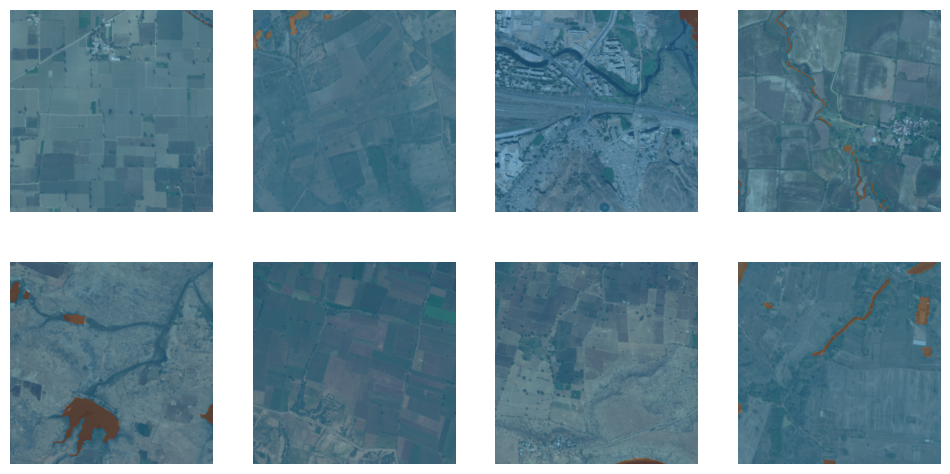

In [14]:
dls.show_batch()

Next, we'll load a convnext model to finetune, set it up as a UNet to use it for segmentation as well as using GradientAccumulation to account for a potentially smaller GPU ram. We also use weight decay for training as we see some overfitting otherwise. The metrics chose were the Dice and the Jaccard coefficients as they give a rough estimation of how well our model performs on the task.

In [151]:
import timm
from functools import partial
model = partial(timm.create_model, "timm/convnext_base.fb_in22k")

In [152]:
learner = unet_learner(dls, model, metrics=(DiceMulti, JaccardCoeffMulti), cbs=GradientAccumulation(8), wd=0.01)

In [153]:
learner.fine_tune(10)

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.401298,0.223697,0.784546,0.678392,02:15


epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.213462,0.147547,0.878739,0.795366,02:30
1,0.174159,0.131637,0.901401,0.828071,02:31
2,0.179973,0.146711,0.895704,0.820034,02:31
3,0.153584,0.290603,0.905732,0.834541,02:30
4,0.147422,0.126661,0.906602,0.835814,02:30
5,0.130548,0.112116,0.913517,0.846766,02:30
6,0.119365,0.106847,0.916350,0.851436,02:31
7,0.104744,0.103896,0.917084,0.852627,02:30
8,0.099128,0.101964,0.919307,0.856059,02:30
9,0.105684,0.103020,0.918653,0.855117,02:30


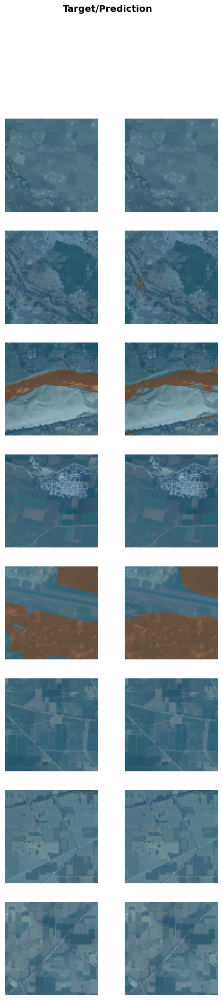

In [156]:
learner.show_results()

In [158]:
if iskaggle:
    out_path = Path("/kaggle/working/")
else: out_path = Path.cwd()

learner.export(out_path / "binary_unet_convnext_focal_256px_10e_bs8_gac_aug.pkl")

After exporting the model, we take a look at the top losses of our model to see the worst performances.

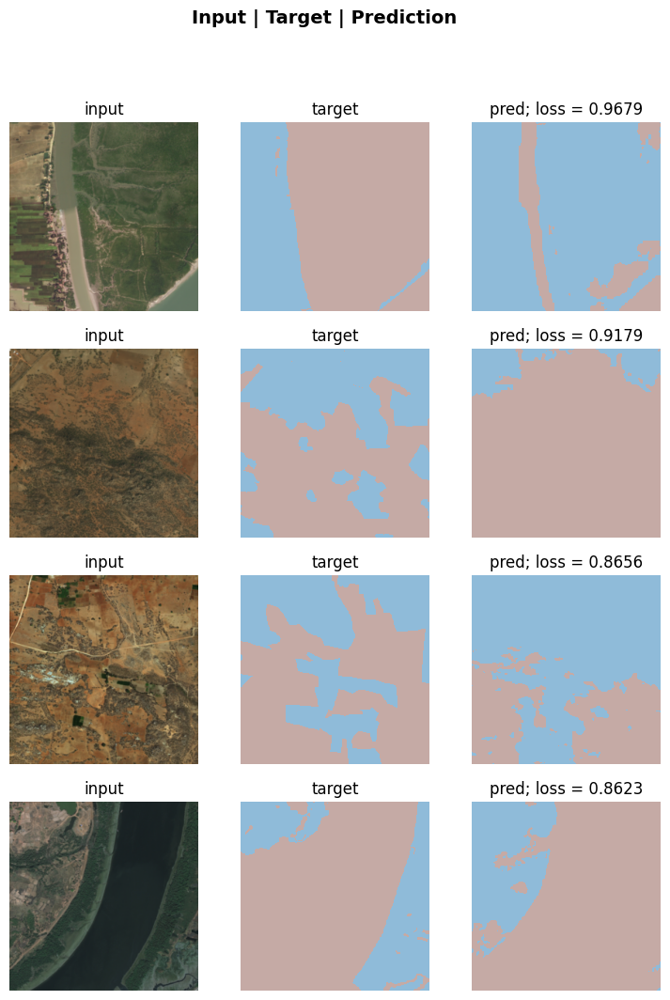

In [157]:
interp = Interpretation.from_learner(learner)
interp.plot_top_losses(4)

Even though the segmentations have huge differences, the model doesn't fail to detect deforestation - but when looking at the images, we can also see that these cases are actually hard to decide.

## Displaying test images

In this chapter, we load images from the test folder and test our segmentation model on them. Unfortunately, the test images are not annotated so we have to evaluate them by ourselves - even if that is not 100% accurate, it still gives us a somewhat good feedback. We also used this part to explore the models output data and to build a basic pipeline that can take a filename of an image and return a segmentation mask.

In [159]:
test_fnames = get_image_files(path / "test"); test_fnames[:5]

(#5) [Path('/kaggle/input/preprocessingbinary/archive/test/983689_sat.jpg'),Path('/kaggle/input/preprocessingbinary/archive/test/793841_sat.jpg'),Path('/kaggle/input/preprocessingbinary/archive/test/1499_sat.jpg'),Path('/kaggle/input/preprocessingbinary/archive/test/209073_sat.jpg'),Path('/kaggle/input/preprocessingbinary/archive/test/999380_sat.jpg')]

In [205]:
def display_test_image(idx):
    img_path = test_fnames[idx]
    _, pred, _ = learner.predict(img_path)
    return pred

In [223]:
pred_proba[1]

TensorBase([[0.5864, 0.6557, 0.6746,  ..., 0.9672, 0.9508, 0.8731],
            [0.6601, 0.7482, 0.7679,  ..., 0.9955, 0.9911, 0.9539],
            [0.6785, 0.7693, 0.7853,  ..., 0.9979, 0.9954, 0.9693],
            ...,
            [0.8974, 0.9699, 0.9810,  ..., 0.9796, 0.9689, 0.8976],
            [0.8725, 0.9558, 0.9702,  ..., 0.9715, 0.9579, 0.8765],
            [0.7728, 0.8770, 0.9027,  ..., 0.9067, 0.8829, 0.7804]])

In [207]:
from matplotlib.colors import LinearSegmentedColormap
cmap_vals = [(0.23, 0.09, 0.003), (0.12, 0.58, 0.24)]
cmap_name = "forest_cmap"
cmap = LinearSegmentedColormap.from_list(cmap_name, cmap_vals, )

In [212]:
img = display_test_image(25)

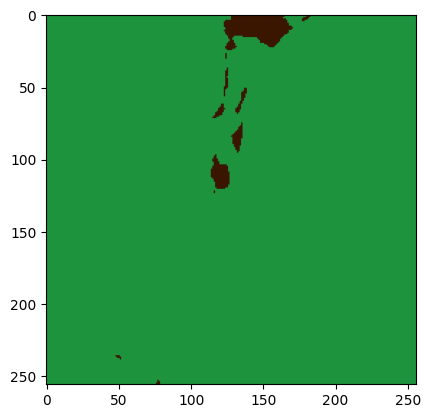

In [213]:
plt.imshow(img, cmap=cmap)

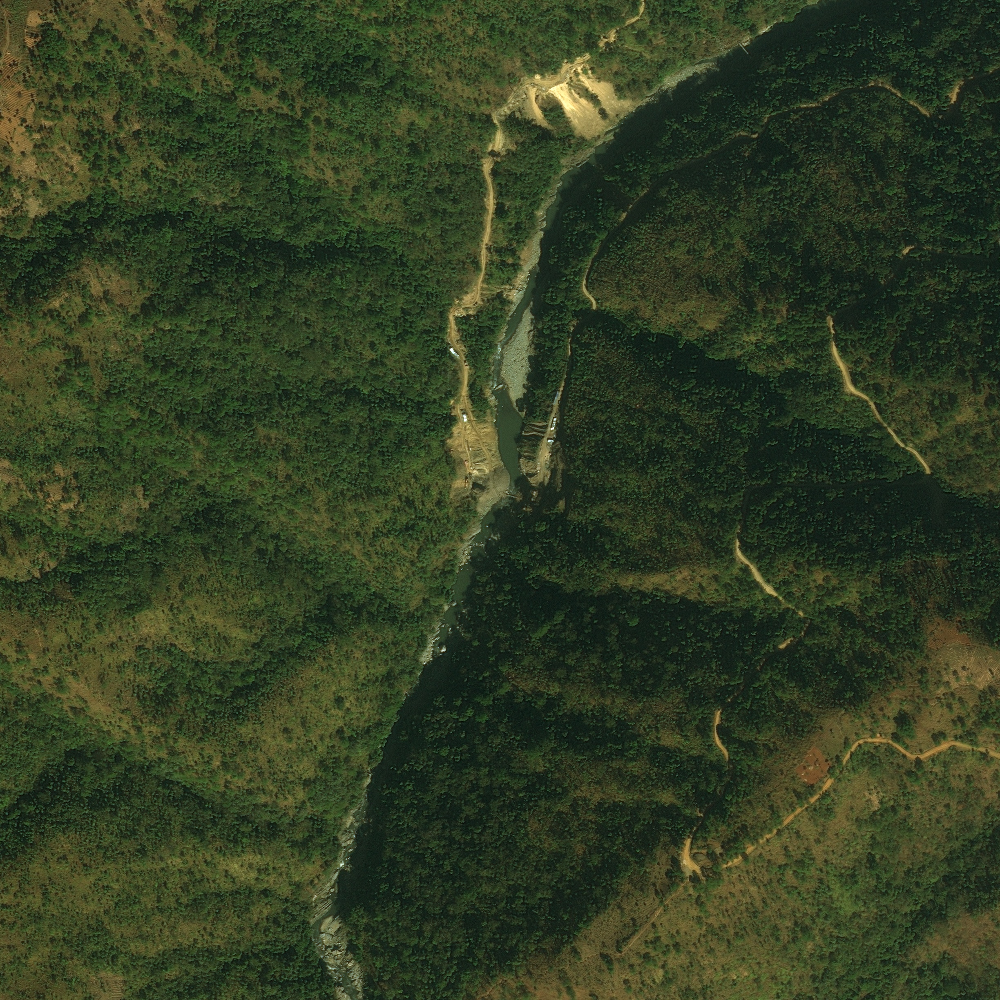

In [211]:
PILImage.create(test_fnames[25])

The next cells output contains some filenames of good examples from the test set that showcase the model's performance on different image types (i.e. no forest, only forest, sparse deforestation, etc.)

In [198]:
test_fnames[7], test_fnames[5], test_fnames[10], test_fnames[25], test_fnames[49]

(Path('/kaggle/input/preprocessingbinary/archive/test/452523_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/test/123976_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/test/779212_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/test/668404_sat.jpg'),
 Path('/kaggle/input/preprocessingbinary/archive/test/119896_sat.jpg'))